# YOLOv5 Balloon Detection Model
Special thanks to @VBOOKSHELF on Kaggle for providing the V2 Balloon Detection Dataset (https://www.kaggle.com/datasets/vbookshelf/v2-balloon-detection-dataset) and framework this notebook is based on (https://www.kaggle.com/code/vbookshelf/basics-of-yolo-v5-balloon-detection)

In [24]:
import pandas as pd
import numpy as np
import os

import ast
import cv2

from sklearn.model_selection import train_test_split
import shutil
from tqdm.notebook import tqdm
import tqdm.notebook as tq

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Set up YOLOv5

In [12]:
import torch
from IPython.display import Image, clear_output

clear_output()
print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Setup complete. Using torch 1.13.1+cu116 (NVIDIA GeForce RTX 3080 Ti Laptop GPU)


# Load V2 Balloon Detection Dataset

In [13]:
base_path = 'Balloon_Dataset/'

file = 'balloon-data.csv'

df_data = pd.read_csv(base_path + file)

# Convert bbox column entries from strings to lists
# "[........]" to [......]
df_data['bbox'] = df_data['bbox'].apply(ast.literal_eval)

print(df_data.shape)

df_data.head()

(74, 5)


,fname,height,width,bbox,num_balloons
0,34020010494_e5cb88e1c4_k.jpg,1536,2048,"[{'xmin': 994, 'ymin': 619, 'xmax': 1445, 'yma...",1
1,25899693952_7c8b8b9edc_k.jpg,1365,2048,"[{'xmin': 135, 'ymin': 115, 'xmax': 811, 'ymax...",1
2,24362039530_b151b41a52_k.jpg,2048,1536,"[{'xmin': 579, 'ymin': 487, 'xmax': 920, 'ymax...",1
3,18849792632_aad23ad513_k.jpg,2048,1536,"[{'xmin': 534, 'ymin': 365, 'xmax': 871, 'ymax...",10
4,17178818589_16e58fc1e5_k.jpg,1536,2048,"[{'xmin': 748, 'ymin': 195, 'xmax': 1425, 'yma...",7


# Split dataset into training and testing

In [14]:
df_train, df_val = train_test_split(df_data, test_size=0.2, random_state=101)

print(df_train.shape)
print(df_val.shape)

(59, 5)
(15, 5)


# Define the file structure below for YOLO

-> base_dir

    -> images
        -> train
        -> validation
        
    -> labels
        -> train
        -> validation

In [15]:
yolo_path = base_path + 'yolov5/'

# Create a new directory inside the yolov5 directory
base_dir = yolo_path + 'base_dir'
os.mkdir(base_dir)

# Create directories inside the directory defined above for labels and images
# images
images = os.path.join(base_dir, 'images')
os.mkdir(images)
# labels
labels = os.path.join(base_dir, 'labels')
os.mkdir(labels)

# Create training and validation directories inside the above folders
# create new folders inside images
train = os.path.join(images, 'train')
os.mkdir(train)
validation = os.path.join(images, 'validation')
os.mkdir(validation)
# create new folders inside labels
train = os.path.join(labels, 'train')
os.mkdir(train)
validation = os.path.join(labels, 'validation')
os.mkdir(validation)

# Preprocess data
A separate text file must be created for each image with its bounding boxes. This function accomplishes this as well as moving the data into the file structure defined above.

In [16]:
# Iterate through each row in the dataframe

# We run the function below separately for
# the train and val sets.
# Remember that each image gets it's own text file
# containing the info for all bboxes on that image.

# For each image:
# 1- get the info for each bounding box
# 2- write the bounding box info to a txt file
# 3- save the txt file in the correct folder
# 4- copy the image to the correct folder


def process_data_for_yolo(df, data_type='train'):

    for _, row in tq.tqdm(df.iterrows(), total=len(df)):
        
        image_name = row['fname']
        bbox_list = row['bbox']
        
        image_width = row['width']
        image_height = row['height']
 
        
        # Convert into the Yolo input format
        # ...................................
        

        yolo_data = []
        
        # row by row
        for coord_dict in bbox_list:

            xmin = int(coord_dict['xmin'])
            ymin = int(coord_dict['ymin'])
            xmax = int(coord_dict['xmax'])
            ymax = int(coord_dict['ymax'])
            
            # We only have one class i.e. balloon.
            # We will set the class_id to 0 for all images.
            # Class numbers must start from 0.
            class_id = 0
            
            bbox_h = int(ymax - ymin)
            bbox_w = int(xmax - xmin)

            x_center = xmin + (bbox_w/2)
            y_center = ymin + (bbox_h/2)
            

            # Normalize
            # Yolo expects the dimensions to be normalized i.e.
            # all values between 0 and 1.

            x_center = x_center/image_width
            y_center = y_center/image_height
            bbox_w = bbox_w/image_width
            bbox_h = bbox_h/image_height

            # [class_id, x-center, y-center, width, height]
            yolo_list = [class_id, x_center, y_center, bbox_w, bbox_h]

            yolo_data.append(yolo_list)

        # convert to nump array
        yolo_data = np.array(yolo_data)


        # save the text file
        image_id = image_name.split('.')[0]
        np.savetxt('Balloon_Dataset/yolov5/base_dir/' + f"labels/{data_type}/{image_id}.txt",
                    yolo_data, 
                    fmt=["%d", "%f", "%f", "%f", "%f"]
                    ) # fmt means format the columns

        # Copy the image to images
        shutil.copyfile(base_path + f"images/{image_name}",
            'Balloon_Dataset/yolov5/base_dir/' + f"images/{data_type}/{image_name}")
        
        

# Call the function    
process_data_for_yolo(df_train, data_type='train')
process_data_for_yolo(df_val, data_type='validation')

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

# Create yaml file

In [17]:
import yaml

yaml_dict = {'train': 'base_dir/images/train',   # path to the train folder
            'val': 'base_dir/images/validation', # path to the val folder
            'nc': 1,                             # number of classes
            'names': ['balloon']}                # list of label names

with open(r'Balloon_Dataset/yolov5/my_data.yaml', 'w') as file:
    documents = yaml.dump(yaml_dict, file)

# Train the model
The YOLOv5 model will be retrained based on its existing weights

In [18]:
# Change the working directory to the yolov5 folder
os.chdir('Balloon_Dataset/yolov5')

In [20]:
# Use Wheat Model
! python train.py --img 1024 --batch 2 --epochs 250 --data my_data.yaml --cfg models/yolov5s.yaml --name wheatmodel

train: weights=yolov5s.pt, cfg=models/yolov5s.yaml, data=my_data.yaml, hyp=data\hyps\hyp.scratch-low.yaml, epochs=250, batch_size=2, imgsz=1024, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs\train, name=wheatmodel, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 
requirements: YOLOv5 requirement "setuptools>=65.5.1" not found, attempting AutoUpdate...


requirements: 1 package updated per G:\My Drive\RIT\Year 4\Spring 2023\Advanced Robotics\Project\Code\Balloon_Dataset\yolov5\requirements.txt
requirements:  Restart runtime or rerun command for updates to take effect

fatal: canno

# View Training Results

In [44]:
wheatmodel_df = pd.read_csv('runs/train/wheatmodel6/results.csv')

display(wheatmodel_df)

,epoch,train/box_loss,train/obj_loss,train/cls_loss,metrics/precision,metrics/recall,metrics/mAP_0.5,metrics/mAP_0.5:0.95,val/box_loss,val/obj_loss,val/cls_loss,x/lr0,x/lr1,x/lr2
0,0,0.114610,0.093028,0,0.024515,0.29310,0.019224,0.004007,0.098090,0.059831,0,0.073900,0.002900,0.002900
1,1,0.095779,0.076573,0,0.230590,0.32042,0.171130,0.052771,0.082506,0.052390,0,0.046877,0.005877,0.005877
2,2,0.087809,0.069469,0,0.186860,0.20690,0.124250,0.030673,0.081240,0.044415,0,0.019830,0.008830,0.008830
3,3,0.083697,0.072789,0,0.055541,0.32759,0.046081,0.011247,0.085154,0.054958,0,0.009881,0.009881,0.009881
4,4,0.090397,0.053717,0,0.480210,0.22414,0.218800,0.051945,0.090087,0.050079,0,0.009881,0.009881,0.009881
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
245,245,0.013647,0.015200,0,0.869170,0.72414,0.767390,0.646650,0.024315,0.039046,0,0.000338,0.000338,0.000338
246,246,0.014115,0.021455,0,0.912820,0.72212,0.768990,0.651650,0.024360,0.038757,0,0.000298,0.000298,0.000298
247,247,0.014586,0.016473,0,0.912960,0.72340,0.768660,0.647720,0.024475,0.038425,0,0.000258,0.000258,0.000258
248,248,0.014992,0.018612,0,0.912960,0.72340,0.768660,0.647720,0.024475,0.038425,0,0.000219,0.000219,0.000219


The entire dataframe can be viewed in the following cell:

In [46]:
# Set the display options to show all rows
pd.set_option('display.max_rows', None)

display(wheatmodel_df)

,epoch,train/box_loss,train/obj_loss,train/cls_loss,metrics/precision,metrics/recall,metrics/mAP_0.5,metrics/mAP_0.5:0.95,val/box_loss,val/obj_loss,val/cls_loss,x/lr0,x/lr1,x/lr2
0,0,0.114610,0.093028,0,0.024515,0.29310,0.019224,0.004007,0.098090,0.059831,0,0.073900,0.002900,0.002900
1,1,0.095779,0.076573,0,0.230590,0.32042,0.171130,0.052771,0.082506,0.052390,0,0.046877,0.005877,0.005877
2,2,0.087809,0.069469,0,0.186860,0.20690,0.124250,0.030673,0.081240,0.044415,0,0.019830,0.008830,0.008830
3,3,0.083697,0.072789,0,0.055541,0.32759,0.046081,0.011247,0.085154,0.054958,0,0.009881,0.009881,0.009881
4,4,0.090397,0.053717,0,0.480210,0.22414,0.218800,0.051945,0.090087,0.050079,0,0.009881,0.009881,0.009881
5,5,0.085060,0.048225,0,0.287360,0.39655,0.225230,0.056180,0.074472,0.041825,0,0.009842,0.009842,0.009842
6,6,0.079933,0.049478,0,0.464400,0.18966,0.242940,0.075472,0.083843,0.037786,0,0.009802,0.009802,0.009802
7,7,0.077847,0.055835,0,0.313340,0.53501,0.264450,0.095525,0.065086,0.036935,0,0.009762,0.009762,0.009762
8,8,0.072901,0.053426,0,0.313340,0.53501,0.264450,0.095525,0.065086,0.036935,0,0.009723,0.009723,0.009723
9,9,0.075265,0.051170,0,0.235150,0.48276,0.216690,0.081728,0.065948,0.037503,0,0.009683,0.009683,0.009683


Next we will view trends within the above dataframe.

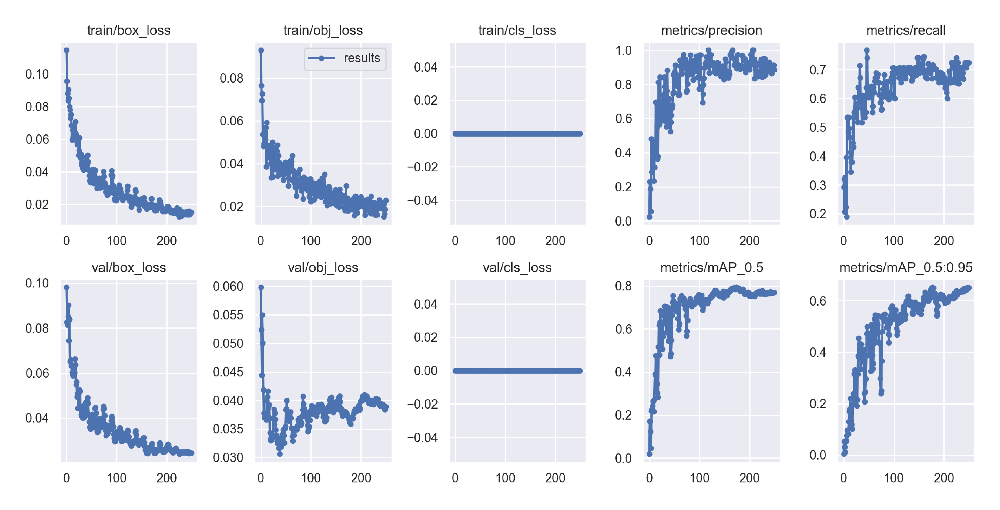

In [55]:
path2wm = 'runs/train/wheatmodel6/'

img = mpimg.imread(path2wm + 'results.png')

fig = plt.figure(figsize=(12,12), dpi=500)

plt.imshow(img, interpolation='none')
plt.axis('off')
plt.show()

# View P, R, PR, and F1 curves
As we can see, the new YOLO model is able to classify balloons as well as the other 80 classes

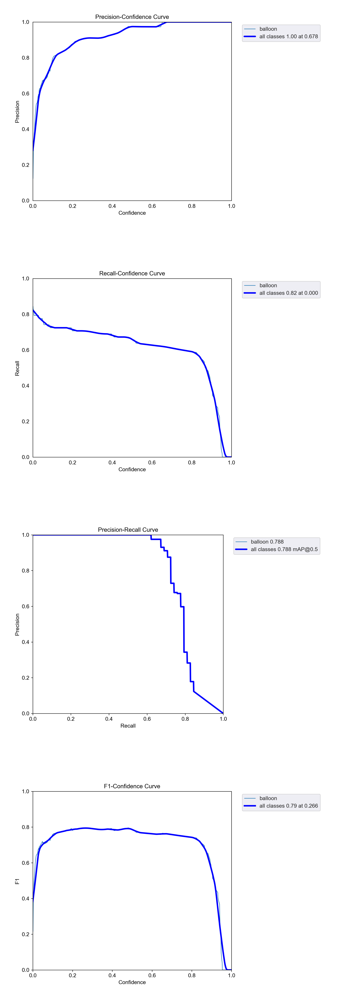

In [61]:
# Load the curve images
p_crv = mpimg.imread(path2wm + 'P_curve.png')
r_crv = mpimg.imread(path2wm + 'R_curve.png')
pr_crv = mpimg.imread(path2wm + 'PR_curve.png')
f1_crv = mpimg.imread(path2wm + 'F1_curve.png')

# Create a 2x2 grid of subplots
fig, axs = plt.subplots(4, 1, figsize=(5, 15), dpi=500)

# Display the curves in the subplots
axs[0].imshow(p_crv)
axs[1].imshow(r_crv)
axs[2].imshow(pr_crv)
axs[3].imshow(f1_crv)

# Turn off the axis labels
for ax in axs.flatten():
    ax.axis('off')

# Show the plot
plt.show()

# View Confusion Matrix
We have a good model!

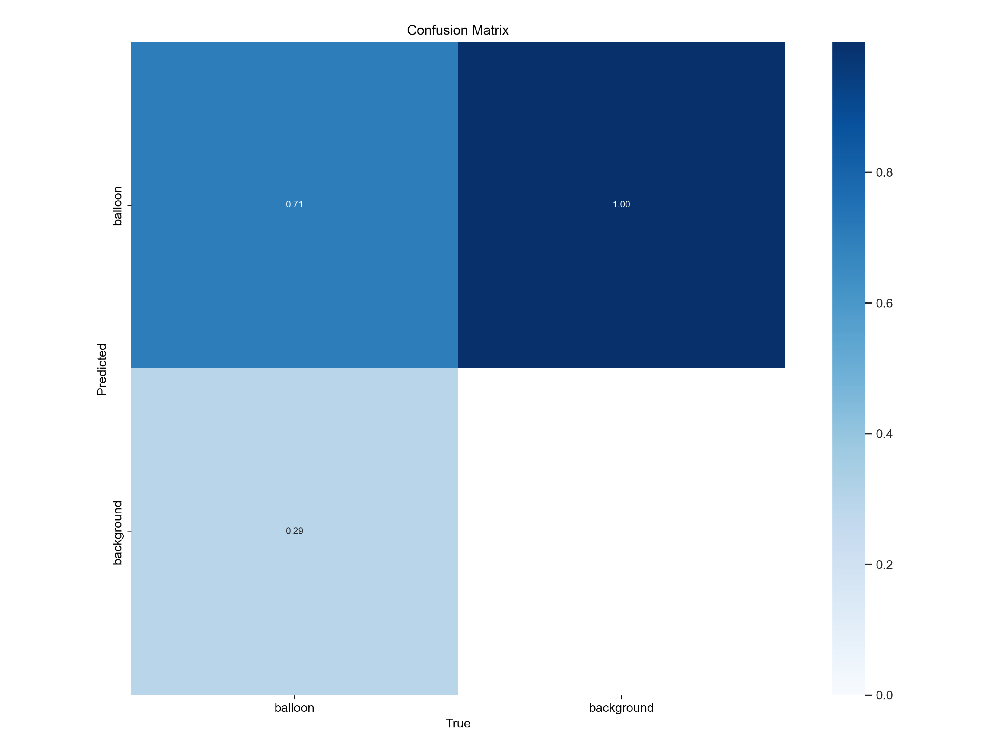

In [62]:
img = mpimg.imread(path2wm + 'confusion_matrix.png')

fig = plt.figure(figsize=(12,12), dpi=500)

plt.imshow(img, interpolation='none')
plt.axis('off')
plt.show()

# Display Validation Images
YOLO made predictions on three sets of validation images. They're shown below along with their labeled counterparts

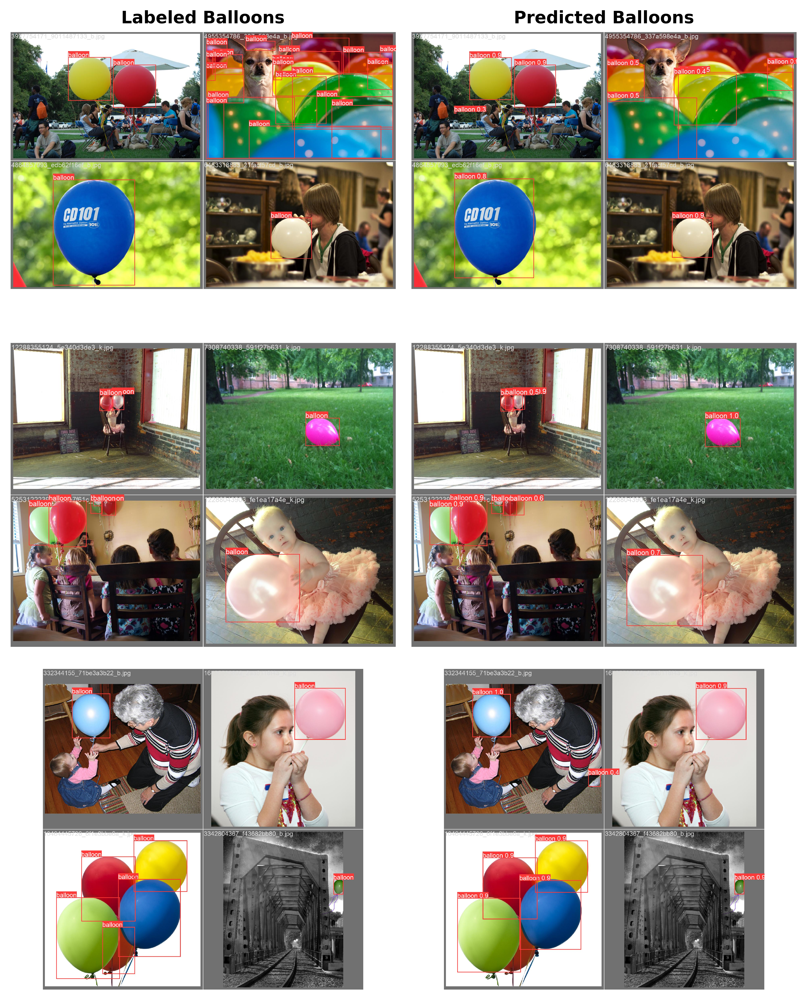

In [56]:
# Define the file locations of the images
img_files = [path2wm + 'val_batch0_labels.jpg', path2wm + 'val_batch0_pred.jpg',
             path2wm + 'val_batch1_labels.jpg', path2wm + 'val_batch1_pred.jpg',
             path2wm + 'val_batch2_labels.jpg', path2wm + 'val_batch2_pred.jpg',]

# Load the images into NumPy arrays
images = [mpimg.imread(f) for f in img_files]

# Create a 3x2 grid of subplots
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(8, 10), dpi=500)

# Set the left column to say "Labels" and the right column to say "Predicted"
axes[0, 0].set_title('Labeled Balloons', fontsize=12, fontweight='bold')
axes[0, 1].set_title('Predicted Balloons', fontsize=12, fontweight='bold')


# Plot each image in a subplot
for i, ax in enumerate(axes.flat):
    if i < len(images):
        ax.imshow(images[i], interpolation='none')
    ax.set_axis_off()

# Display the plot
plt.tight_layout()
plt.show()